# Quality filter and clustering in Set 2 (10X, Trypsin)

In [1]:
#loading packages
library(ggplot2)
library(magrittr)
library(data.table)
library(Seurat)
library(DropletUtils)
library(Matrix)
library(dplyr)

Loading required package: SingleCellExperiment

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    

In [2]:
# loading count data
t <- readr::read_delim('../../data/original_data/Set2/Gene/filtered/matrix.mtx', delim = ' ', skip = 3, col_names = FALSE)

Registered S3 method overwritten by 'cli':
  method     from    
  print.boxx spatstat

─ Column specification ────────────────────────────────────────────────────────────────────
cols(
  X1 = col_double(),
  X2 = col_double(),
  X3 = col_double()
)




In [3]:
head(t)

X1,X2,X3
<dbl>,<dbl>,<dbl>
10,1,4
13,1,1
14,1,3
15,1,1
20,1,1
25,1,1


In [4]:
#loading gene info
genes <- read.table("../../data/original_data/Set2/Gene/filtered/features.tsv", header = F)
dim(genes)
head(genes)

[1] 17504     4

,V1,V2,V3,V4
,<chr>,<chr>,<chr>,<chr>
1,FBgn0267431,Myo81F,Gene,Expression
2,FBgn0085804,CR41571,Gene,Expression
3,FBgn0039987,CR12798,Gene,Expression
4,FBgn0267798,lncRNA:CR46123,Gene,Expression
5,FBgn0267797,lncRNA:CR46122,Gene,Expression
6,FBgn0058182,CR40182,Gene,Expression


In [5]:
genes <- genes[, 2]
length(genes)

[1] 17504

In [6]:
#loading barcode info
cells <- read.table("../../data/original_data/Set2/Gene/filtered/barcodes.tsv", header = F)
dim(cells)
head(cells)

[1] 8043    1

,V1
,<chr>
1,AAACCCAAGTGACCTT
2,AAACCCACAAGTGATA
3,AAACCCACACTTGGCG
4,AAACCCATCCGTGTCT
5,AAACGAAAGAATCGTA
6,AAACGAAAGACTTCCA


In [7]:
cells <- cells[, 1]
length(cells)

[1] 8043

In [8]:
umi_count <- Matrix::sparseMatrix(
  i = t$X1,
  j = t$X2,
  x = t$X3,
  dims = c(length(genes), length(cells))
)

In [9]:
dim(umi_count)

[1] 17504  8043

In [10]:
rownames(umi_count) <- genes
colnames(umi_count) <- cells

## Filtering by total counts

In [11]:
bc_rank <- barcodeRanks(umi_count)

In [12]:
metadata(bc_rank)$knee
metadata(bc_rank)$inflection

[1] 17844

[1] 8557

In [13]:
tot_counts <- Matrix::colSums(umi_count)
summary(tot_counts)
sum(tot_counts)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   7501   16122   22765   24420   30284  277912 

[1] 196413885

star solo filtered results was used as lower bound of total count

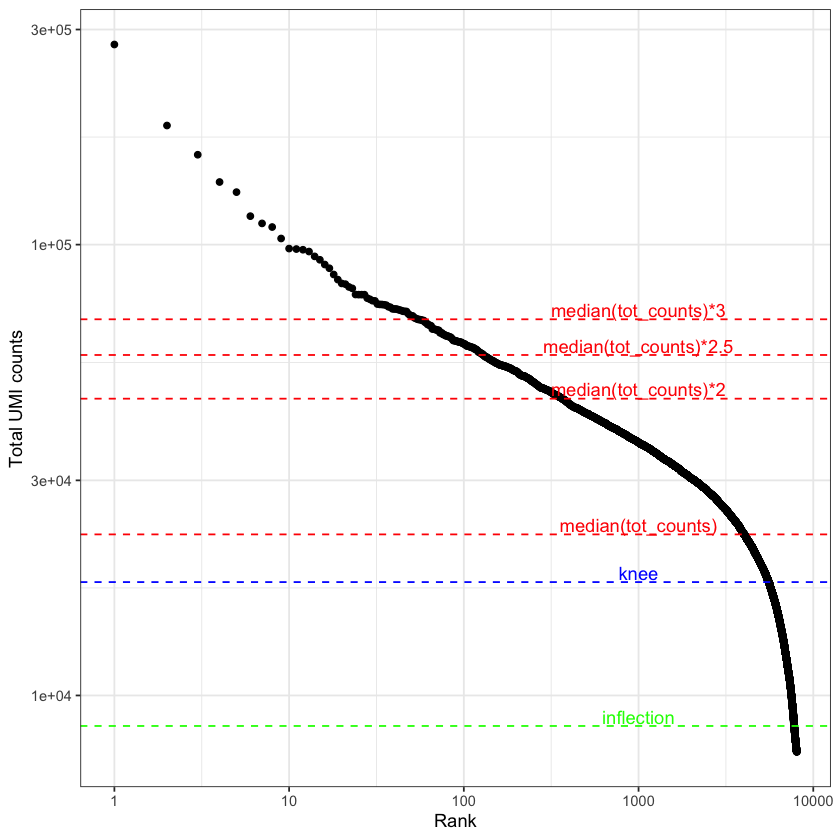

In [14]:
#https://www.bioconductor.org/packages/devel/bioc/vignettes/BUSpaRse/inst/doc/sparse-matrix.html
qplot(bc_rank$rank, bc_rank$total, geom = "point") +
  geom_hline(yintercept = metadata(bc_rank)$knee, color = "blue", linetype = 2) +
  geom_hline(yintercept = metadata(bc_rank)$inflection, color = "green", linetype = 2) +
  geom_hline(yintercept = median(tot_counts), color = "red", linetype = 2) +
  geom_hline(yintercept = median(tot_counts)*2, color = "red", linetype = 2) +
  geom_hline(yintercept = median(tot_counts)*2.5, color = "red", linetype = 2) +
  geom_hline(yintercept = median(tot_counts)*3, color = "red", linetype = 2) +
  annotate("text", x = 1000, y = 1.05 * c(median(tot_counts)*3, median(tot_counts)*2.5, median(tot_counts)*2, median(tot_counts), 
                                          metadata(bc_rank)$knee, metadata(bc_rank)$inflection),
           label = c("median(tot_counts)*3","median(tot_counts)*2.5","median(tot_counts)*2","median(tot_counts)","knee", "inflection"), 
           color = c("red","red","red", "red", "blue", "green")) +
  scale_x_log10() +
  scale_y_log10() +
  labs(x = "Rank", y = "Total UMI counts") +
  theme_bw()

In [15]:
head(sort(tot_counts, decreasing = T))

TTCTAACGTTACCCTC GAACTGTAGCTCACTA AAAGGATGTTAAGACA GTATTTCCAACGACTT 
          277912           183743           158269           137686 
GATGGAGAGGGTCAAC ATTCACTGTAGTGGCA 
          130751           115652

In [16]:
umi_count_2 <- umi_count[, tot_counts < median(tot_counts)*2]
dim(umi_count_2)

[1] 17504  7677

<!-- 10x manualによると　Multiplet Rate (%)は
Multiplet Rate (%),　num of Cells Loaded, num of Cells Recovered
~3.9%　~8,000　~5,000　
~4.6%　~9,600　~6,000
~5.4%　~11,200　~7,000
とのことなので、5% 程度　(400細胞程度）と予想。
tot_countのmedian x2 を閾値とすると、およそ366細胞が除かれた -->

Using median x 2 of total UMI counts as threshold, 366 cells were removed as multiplet.

In [17]:
tot_counts2 <- Matrix::colSums(umi_count_2)
summary(tot_counts2)
sum(tot_counts2)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   7501   15790   22131   22806   29208   45474 

[1] 175079985

In [18]:
seu <- CreateSeuratObject(umi_count_2) 
seu

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
17504 features across 7677 samples within 1 assay 
Active assay: RNA (17504 features, 0 variable features)

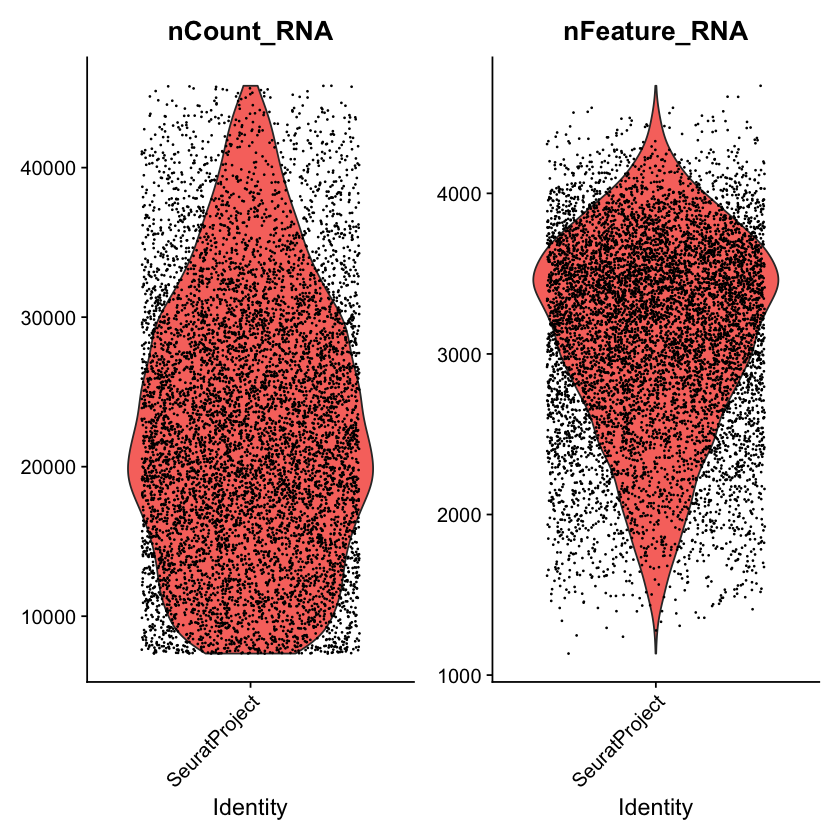

In [19]:
VlnPlot(seu, c("nCount_RNA", "nFeature_RNA"), pt.size = 0.1)

In [20]:
summary(seu$nCount_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   7501   15790   22131   22806   29208   45474 

In [21]:
summary(seu$nFeature_RNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1134    2696    3202    3112    3583    4670 

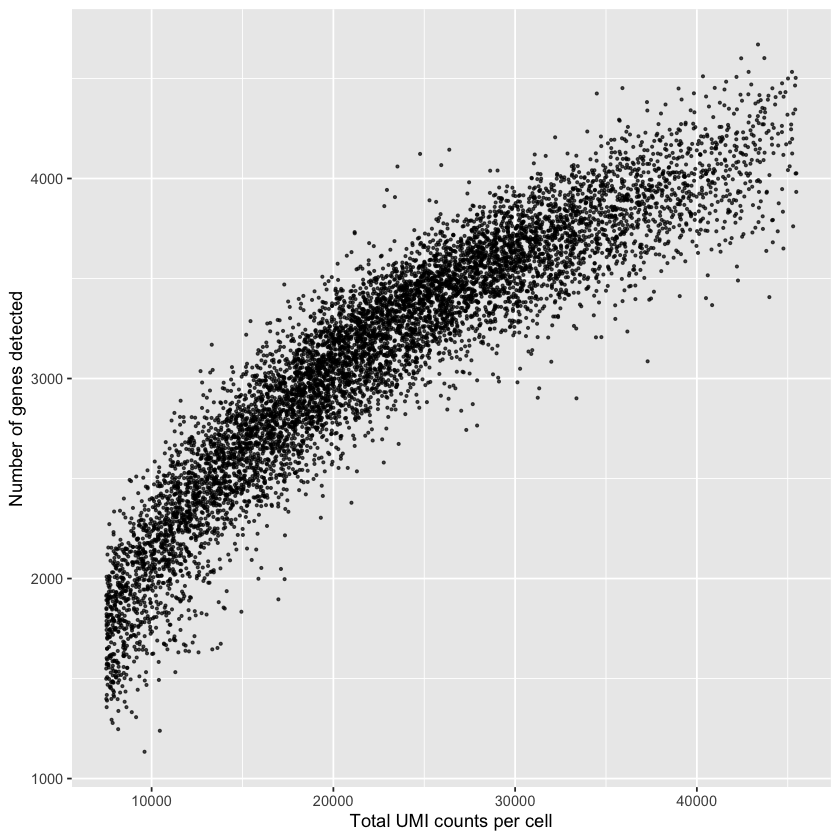

In [22]:
ggplot(seu@meta.data, aes(nCount_RNA, nFeature_RNA)) +
  geom_point(alpha = 0.7, size = 0.5) +
  labs(x = "Total UMI counts per cell", y = "Number of genes detected")

## Quality filter by percent.mt, percent.rRNA and nFeature_RNA.  
percent.mt: percentage of transcripts from mitochondoial genome  
percent.rRNA: percentage of rRNA  
nFeature_RNA: the number of detected genes

In [23]:
# rRNA_list <- read.table("/Volumes/SD_TK_2T/genome_ref/sakaguchi_revised/BDGP6.22.98_210311/rRNA_list.txt")
is.mt <- grepl(pattern = '^mt:', x = row.names(seu))
is.rRNA <- grepl(pattern = 'rRNA', x = row.names(seu))
is.rRNA <- is.rRNA & (!is.mt)
mt.list <- row.names(seu)[is.mt]
rRNA_list <- row.names(seu)[is.rRNA]

In [24]:
head(rRNA_list)

[1] "5SrRNA:CR33452" "5SrRNA:CR33451" "5SrRNA:CR33450" "5SrRNA:CR33449"
[5] "5SrRNA:CR33448" "5SrRNA:CR33447"

In [25]:
length(rRNA_list)

[1] 116

In [26]:
seu[["percent.mt"]] <- PercentageFeatureSet(seu, pattern = "^mt:")
seu[["percent.rRNA"]] <- PercentageFeatureSet(seu, features = rRNA_list)

In [27]:
summary(seu$percent.mt)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.4707  5.5280  6.5464  6.8072  7.8207 30.0784 

In [28]:
summary(seu$percent.rRNA)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.3949  1.1539  1.5297  1.8513  2.1588 22.3780 

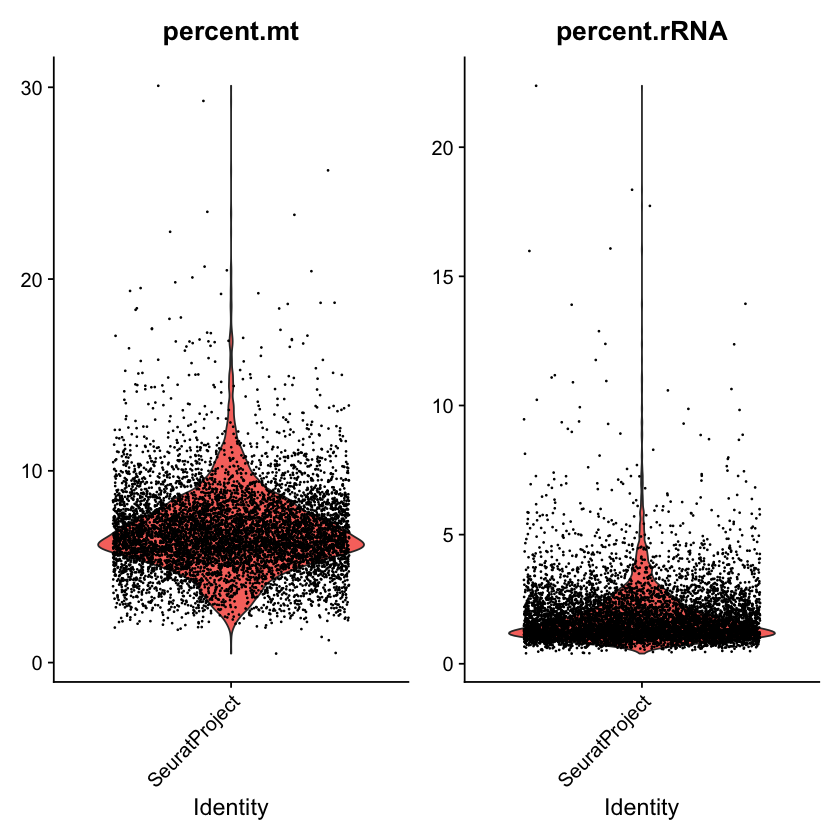

In [29]:
VlnPlot(seu, features = c("percent.mt", "percent.rRNA"), pt.size = 0.1)

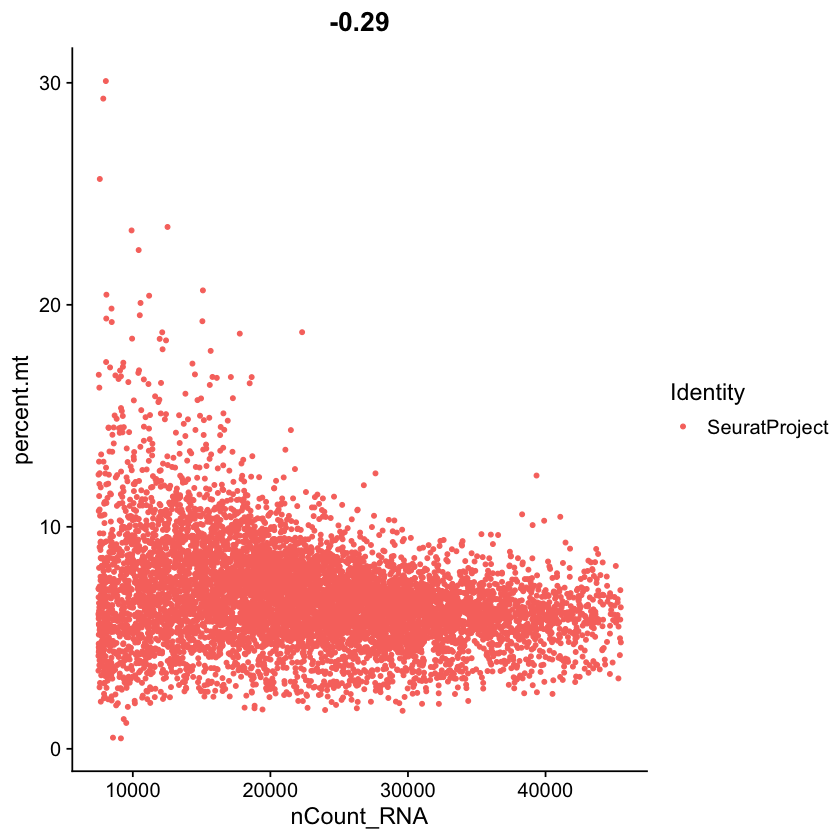

In [30]:
FeatureScatter(seu, feature1 = "nCount_RNA", feature2 = "percent.mt")

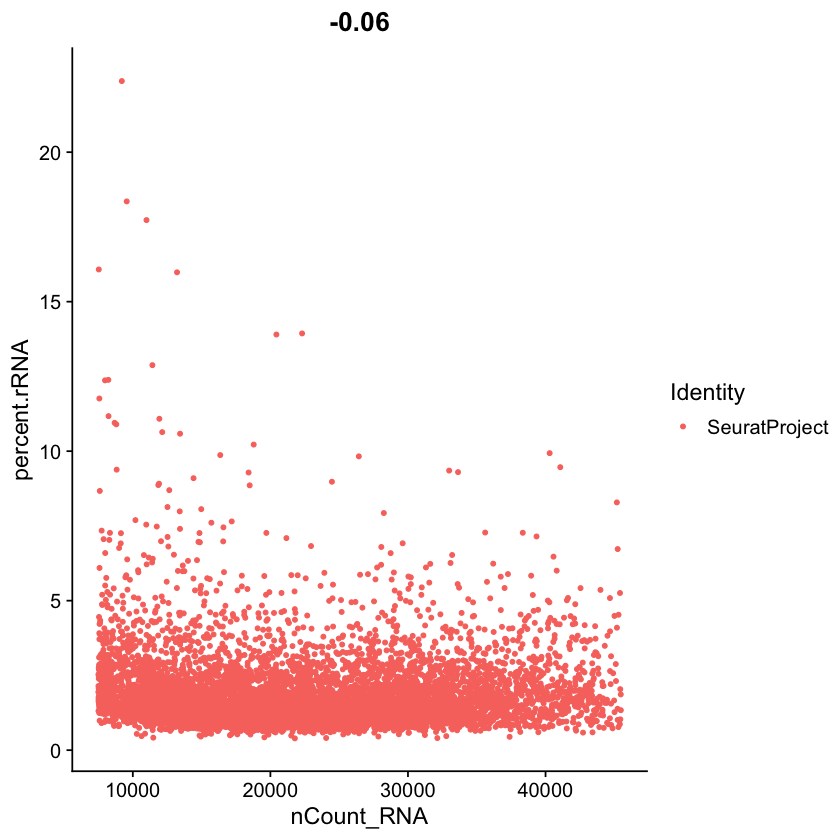

In [31]:
FeatureScatter(seu, feature1 = "nCount_RNA", feature2 = "percent.rRNA")

In [32]:
percent.mt <- as.data.frame(seu$percent.mt)
colnames(percent.mt) <- c("percent.mt")
head(percent.mt)

,percent.mt
,<dbl>
AAACCCAAGTGACCTT,7.216738
AAACCCACAAGTGATA,7.078394
AAACCCACACTTGGCG,8.931041
AAACCCATCCGTGTCT,8.616333
AAACGAAAGAATCGTA,5.640403
AAACGAAAGACTTCCA,2.473708


In [33]:
mito_upper <- mean(percent.mt$percent.mt) + sd(percent.mt$percent.mt)*2.5
mito_lower <- mean(percent.mt$percent.mt) - sd(percent.mt$percent.mt)*2.5
mito_upper
mito_lower

[1] 12.41558

[1] 1.198885

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



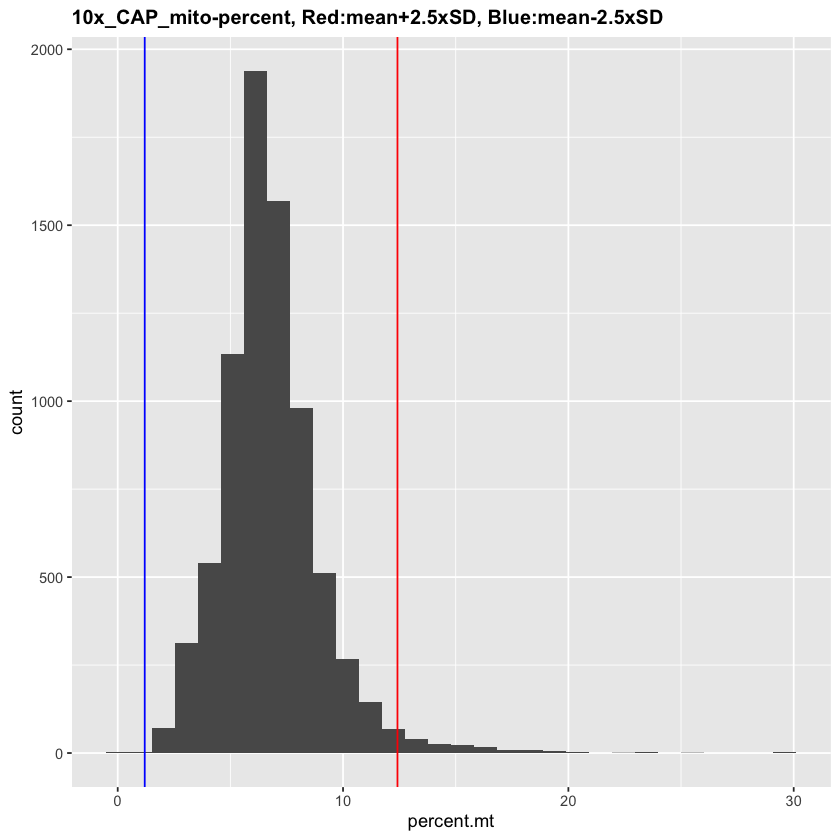

In [34]:
g <- ggplot(percent.mt, aes(x = percent.mt))
g <- g + geom_histogram() + geom_vline(xintercept=mito_upper, colour="red") + 
geom_vline(xintercept=mito_lower, colour="blue")  + 
ggtitle("10x_CAP_mito-percent, Red:mean+2.5xSD, Blue:mean-2.5xSD") + 
theme(plot.title = element_text(size = 12, face = "bold"))
plot(g)

In [35]:
percent.rRNA <- as.data.frame(seu$percent.rRNA)
colnames(percent.rRNA) <- c("percent.rRNA")
head(percent.rRNA)

,percent.rRNA
,<dbl>
AAACCCAAGTGACCTT,2.1961933
AAACCCACAAGTGATA,0.9707791
AAACCCACACTTGGCG,1.5609563
AAACCCATCCGTGTCT,1.3066256
AAACGAAAGAATCGTA,0.9501909
AAACGAAAGACTTCCA,0.8097566


In [36]:
rRNA_upper <- mean(percent.rRNA$percent.rRNA) + sd(percent.rRNA$percent.rRNA)*2.5
rRNA_lower <- mean(percent.rRNA$percent.rRNA) - sd(percent.rRNA$percent.rRNA)*2.5
rRNA_upper
rRNA_lower

[1] 4.869479

[1] -1.166913

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



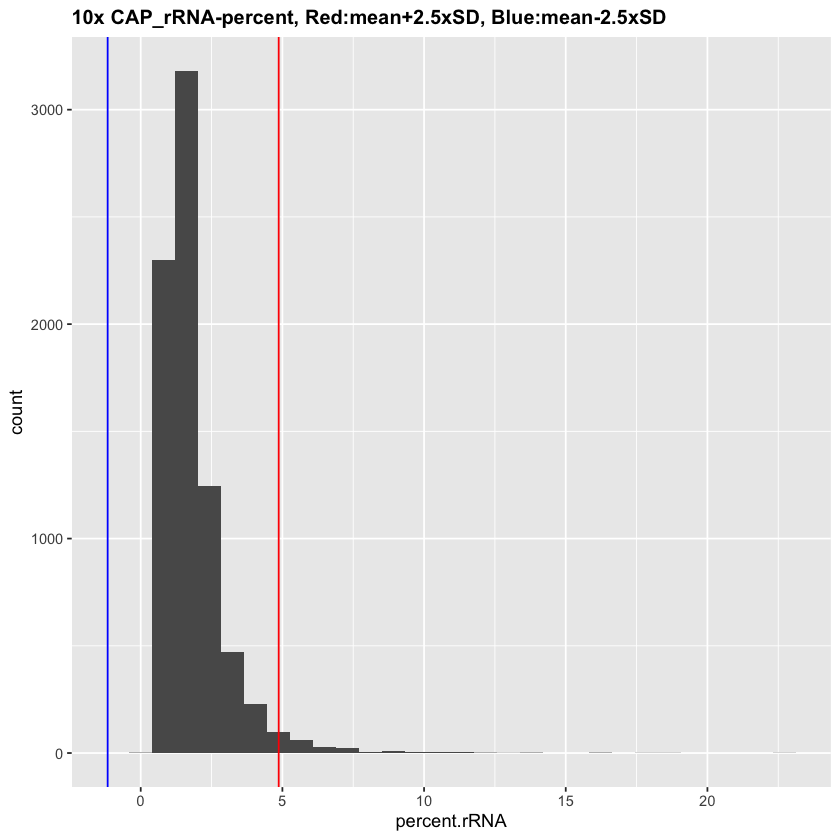

In [37]:
g <- ggplot(percent.rRNA, aes(x = percent.rRNA))
g <- g + geom_histogram() + 
geom_vline(xintercept=rRNA_upper , colour="red") + 
geom_vline(xintercept=rRNA_lower, colour="blue") + 
ggtitle("10x CAP_rRNA-percent, Red:mean+2.5xSD, Blue:mean-2.5xSD") + 
theme(plot.title = element_text(size = 12, face = "bold"))
plot(g)

In [38]:
detected_genes <- seu$nFeature_RNA
detected_genes <- as.data.frame(detected_genes)
head(detected_genes)

,detected_genes
,<int>
AAACCCAAGTGACCTT,2663
AAACCCACAAGTGATA,4038
AAACCCACACTTGGCG,2058
AAACCCATCCGTGTCT,2534
AAACGAAAGAATCGTA,3380
AAACGAAAGACTTCCA,4410


In [39]:
nGene_upper <- mean(detected_genes$detected_genes) + sd(detected_genes$detected_genes)*2.5
nGene_lower <- mean(detected_genes$detected_genes) - sd(detected_genes$detected_genes)*2.5
nGene_upper
nGene_lower

[1] 4676.263

[1] 1547.285

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.



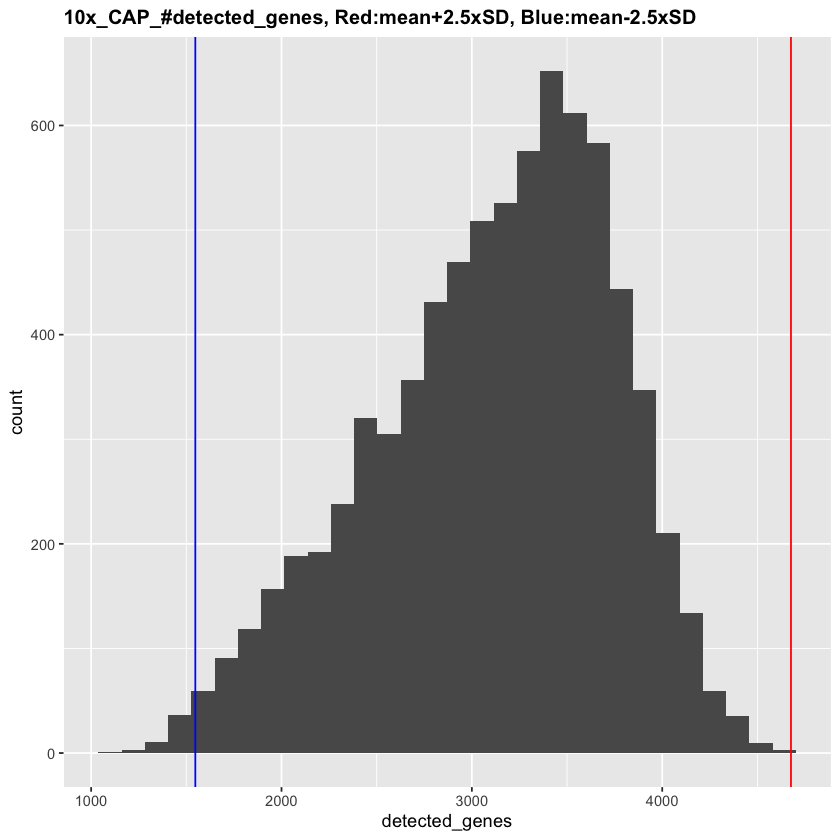

In [40]:
g <- ggplot(detected_genes, aes(x = detected_genes))
g <- g + geom_histogram() + 
geom_vline(xintercept=nGene_upper , colour="red") + 
geom_vline(xintercept=nGene_lower, colour="blue")  + 
ggtitle("10x_CAP_#detected_genes, Red:mean+2.5xSD, Blue:mean-2.5xSD") + 
theme(plot.title = element_text(size = 12, face = "bold"))

plot(g)

In [41]:
seu_HQC <- subset(x = seu, subset = percent.mt < mito_upper & percent.mt > mito_lower &
                 percent.rRNA < rRNA_upper & percent.rRNA > rRNA_lower &
                 nFeature_RNA < nGene_upper & nFeature_RNA > nGene_lower )
seu_HQC

An object of class Seurat 
17504 features across 7314 samples within 1 assay 
Active assay: RNA (17504 features, 0 variable features)

In [42]:
count.table <- as.matrix(GetAssayData(seu_HQC, assay = 'RNA', slot = 'counts'))
head(count.table)
dim(count.table)

,AAACCCAAGTGACCTT,AAACCCACAAGTGATA,AAACCCACACTTGGCG,AAACCCATCCGTGTCT,AAACGAAAGAATCGTA,AAACGAAAGACTTCCA,AAACGAAAGGGTTAGC,AAACGAAGTGAGGAAA,AAACGAAGTGAGTGAC,AAACGAATCAAGCCTA,⋯,TTTGGTTAGCTAATGA,TTTGGTTTCAGAGTTC,TTTGTTGAGGGTACGT,TTTGTTGAGTACTGGG,TTTGTTGCAAGGTTGG,TTTGTTGCACAACGCC,TTTGTTGCATATCTGG,TTTGTTGCATTCAGCA,TTTGTTGGTCCAGAAG,TTTGTTGGTGTGTGGA
Myo81F,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR41571,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR12798,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46123,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
lncRNA:CR46122,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
CR40182,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


[1] 17504  7314

In [43]:
write.table(count.table, file = '../../data/original_data/Set2/umi_count_table_HQC_Set2.csv', sep = ',')

## Normalize, DR and Clustering

In [42]:
seu_HQC <- SCTransform(seu_HQC, vars.to.regress = c("percent.mt", "percent.rRNA"), verbose = FALSE) 

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):
“iteration limit reached”
Warning message in theta.ml(y = y, mu = fit$fitted):

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


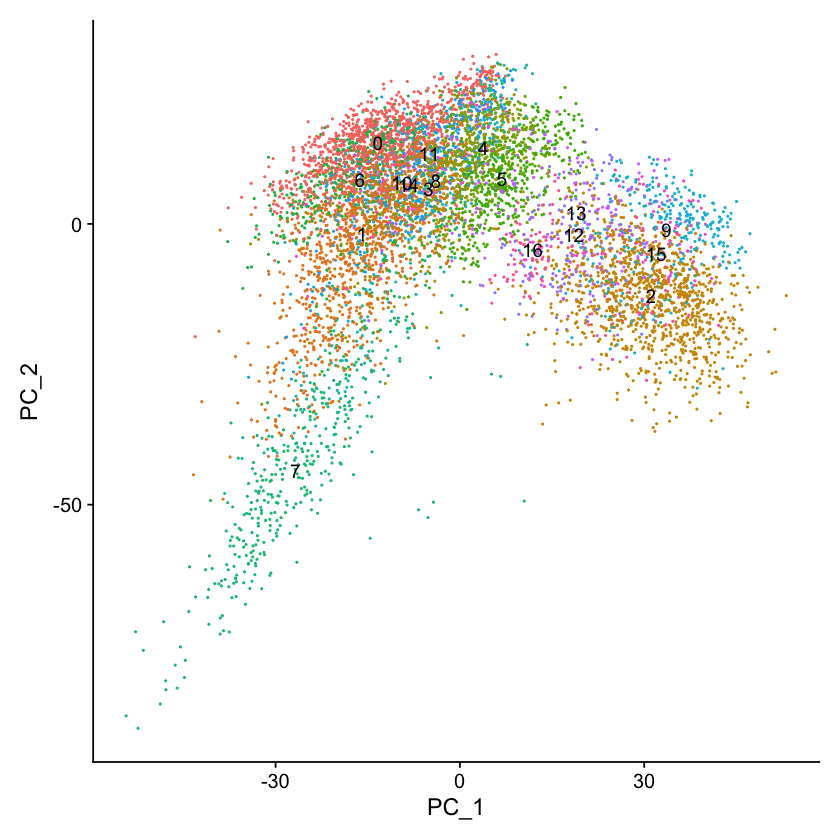

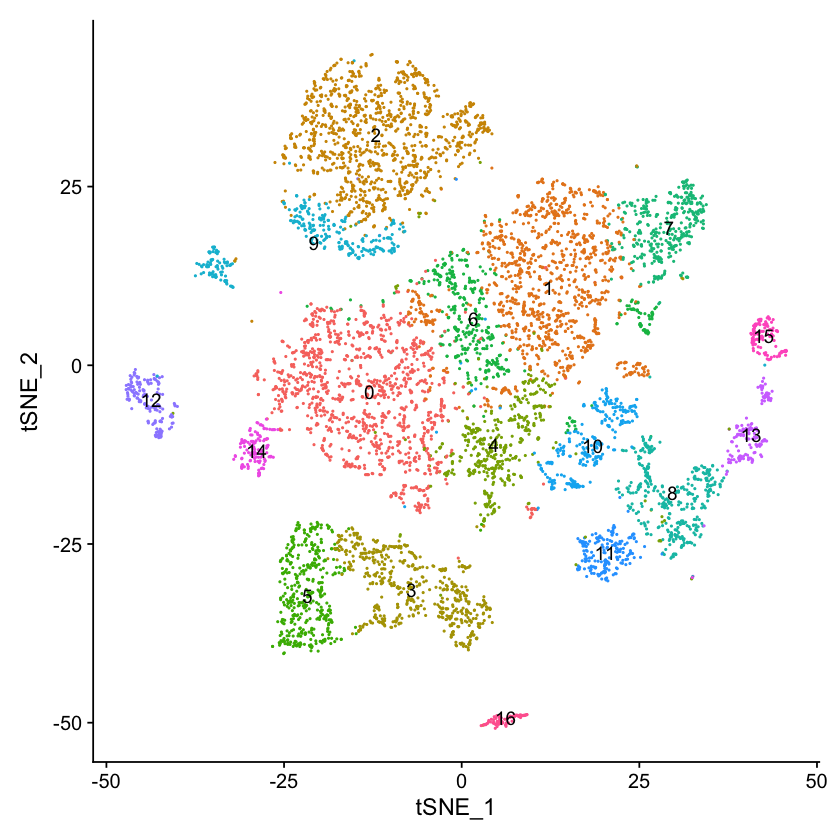

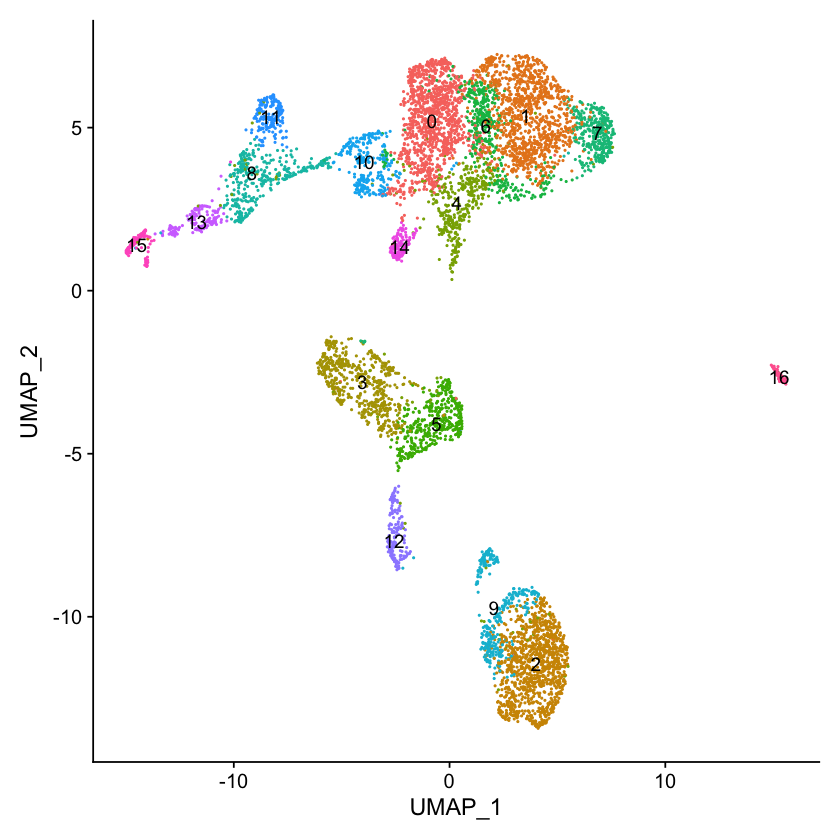

In [43]:
seu_HQC <- RunPCA(seu_HQC, verbose = FALSE)
seu_HQC <- RunTSNE(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- RunUMAP(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- FindNeighbors(seu_HQC, dims = 1:30, verbose = FALSE)
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE)
DimPlot(seu_HQC, reduction =  "pca", label = TRUE) + NoLegend()
DimPlot(seu_HQC, reduction =  "tsne", label = TRUE) + NoLegend()
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

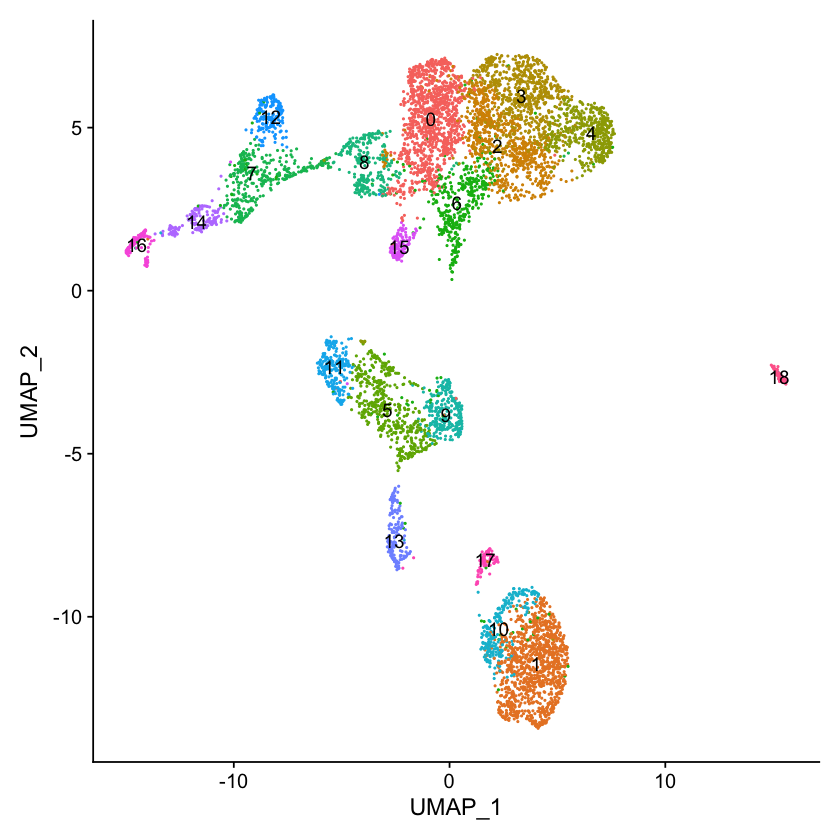

In [44]:
seu_HQC <- FindClusters(seu_HQC, verbose = FALSE, resolution=1)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE) + NoLegend()

In [45]:
all.markers <- FindAllMarkers(object = seu_HQC, only.pos = TRUE)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18



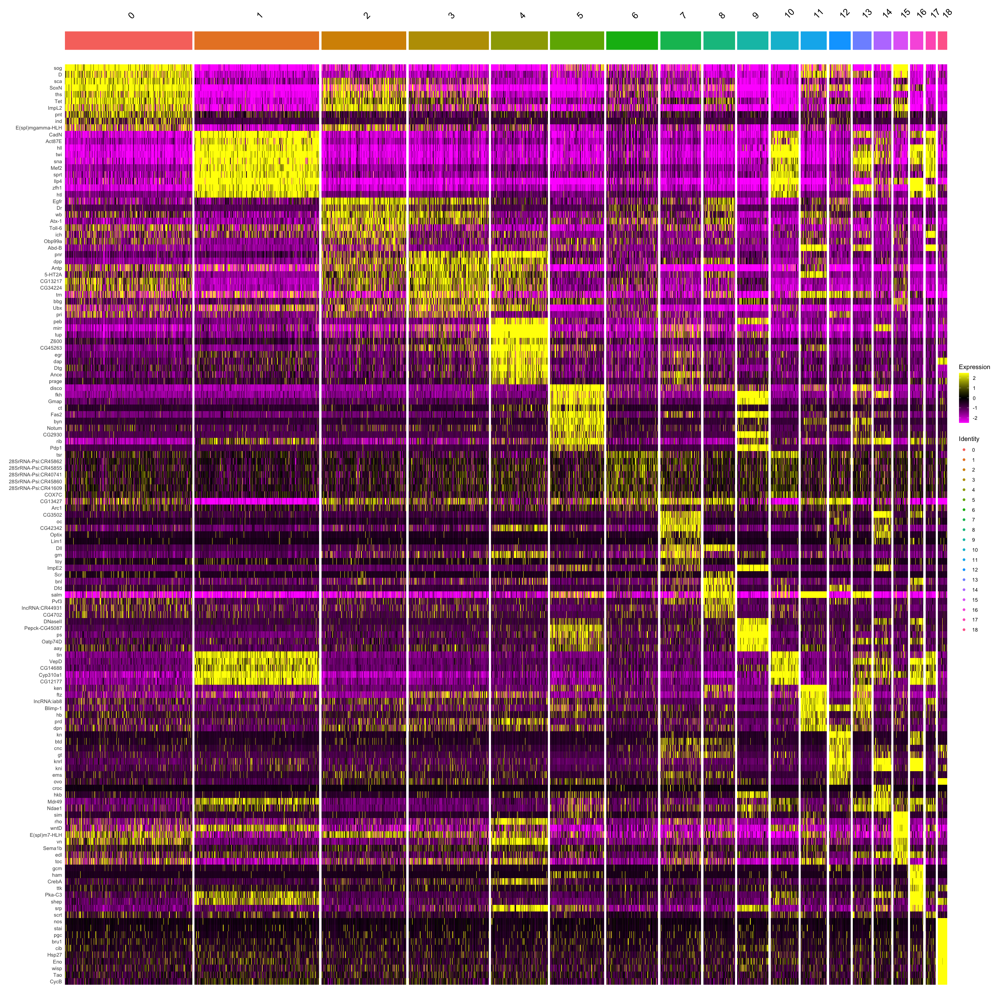

In [46]:
options(repr.plot.width=24, repr.plot.height=24)
DoHeatmap(seu_HQC, features = all.markers.top10$gene)

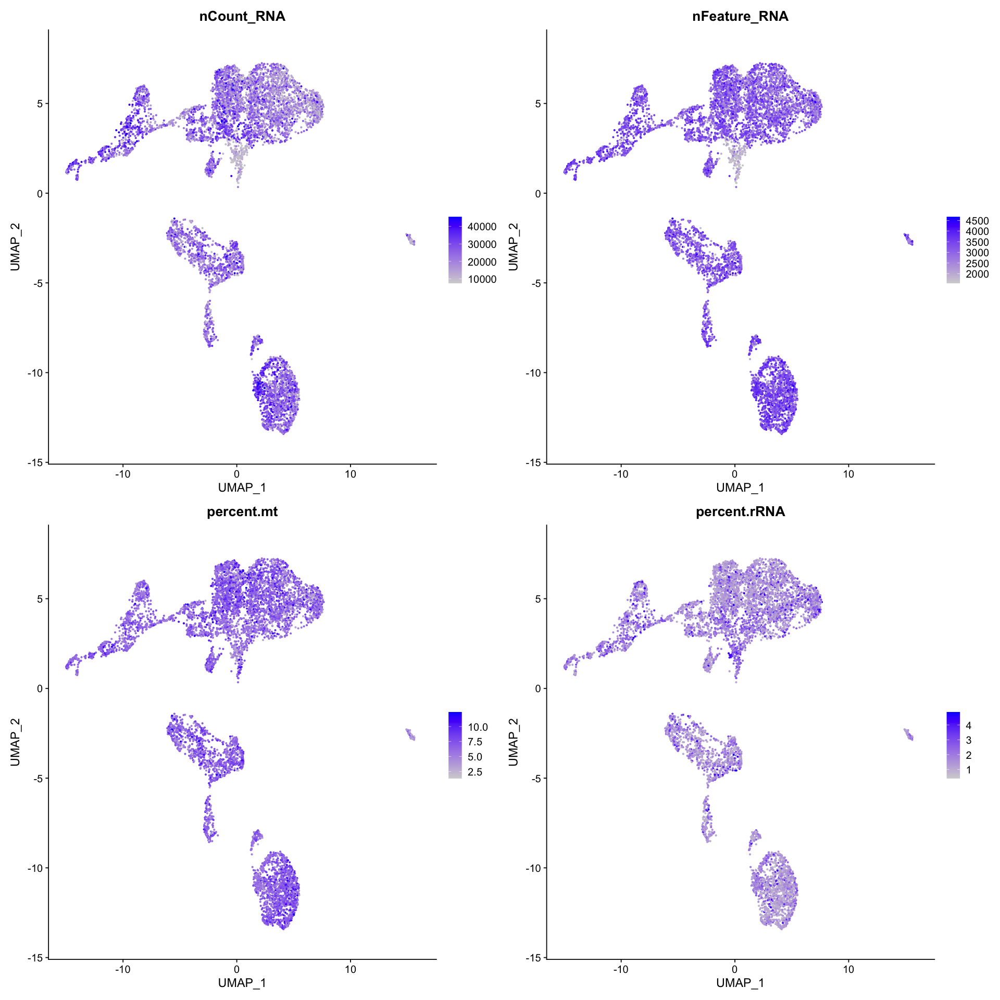

In [47]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("nCount_RNA", "nFeature_RNA", 
                               "percent.mt", "percent.rRNA"), pt.size = 0.5,  ncol = 2)

In [48]:
library(MAST)

In [49]:
head(FindMarkers(seu_HQC, ident.1 = "1", ident.2 = "10", test.use = "MAST"), n=30)



 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>----------------------


 Completed [==================================>---------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [===========================


 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1.000,1.000,1.560757e-85
tsr,7.205497e-86,-0.5042628,1.000,1.000,8.160946e-82
His4r,1.127313e-83,-0.4242723,1.000,1.000,1.276795e-79
kis,7.644049e-82,0.6738195,0.999,0.988,8.657650e-78
Fkbp12,7.391129e-80,-0.3946673,1.000,1.000,8.371193e-76
roh,4.088191e-78,-0.5237355,1.000,1.000,4.630285e-74
mt:ND1,5.119387e-78,0.5850379,0.999,1.000,5.798218e-74
robo2,7.626453e-78,0.6954407,0.996,0.938,8.637721e-74
RpL41,8.279232e-77,-0.2805060,1.000,1.000,9.377058e-73


In [50]:
head(FindMarkers(seu_HQC, ident.1 = c("0", "2", "3"), ident.2 = "6", test.use = "MAST"), n=30)



 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>----------------------


 Completed [================================>-----------]  76% with 0 failures

 Completed [=================================>----------]  76% with 0 failures

 Completed [=================================>----------]  77% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [==================================>---------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [===========================


 Completed [====================>-----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=====================>----------------------]  51% with 0 failures

 Completed [======================>---------------------]  51% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  53% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>--

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
lncRNA:roX1,2.519735e-321,0.8412685,1.000,0.998,2.853852e-317
Dl,3.914782e-277,0.8809008,1.000,1.000,4.433882e-273
Tet,4.220539e-238,1.0375999,0.998,0.982,4.780183e-234
Brd,3.633919e-207,1.2485449,0.995,0.971,4.115777e-203
hth,1.320495e-203,0.6381474,1.000,1.000,1.495593e-199
robo2,6.584038e-203,0.8199377,0.998,0.987,7.457082e-199
E(spl)m4-BFM,3.941143e-195,0.8644873,0.996,0.982,4.463739e-191
E(spl)m5-HLH,2.056158e-191,1.1322579,0.942,0.824,2.328804e-187
E(spl)m7-HLH,5.190761e-191,1.1310050,0.980,0.922,5.879056e-187


cluster6, 10で共通してtsrの発現が高い

In [51]:
library(RColorBrewer)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



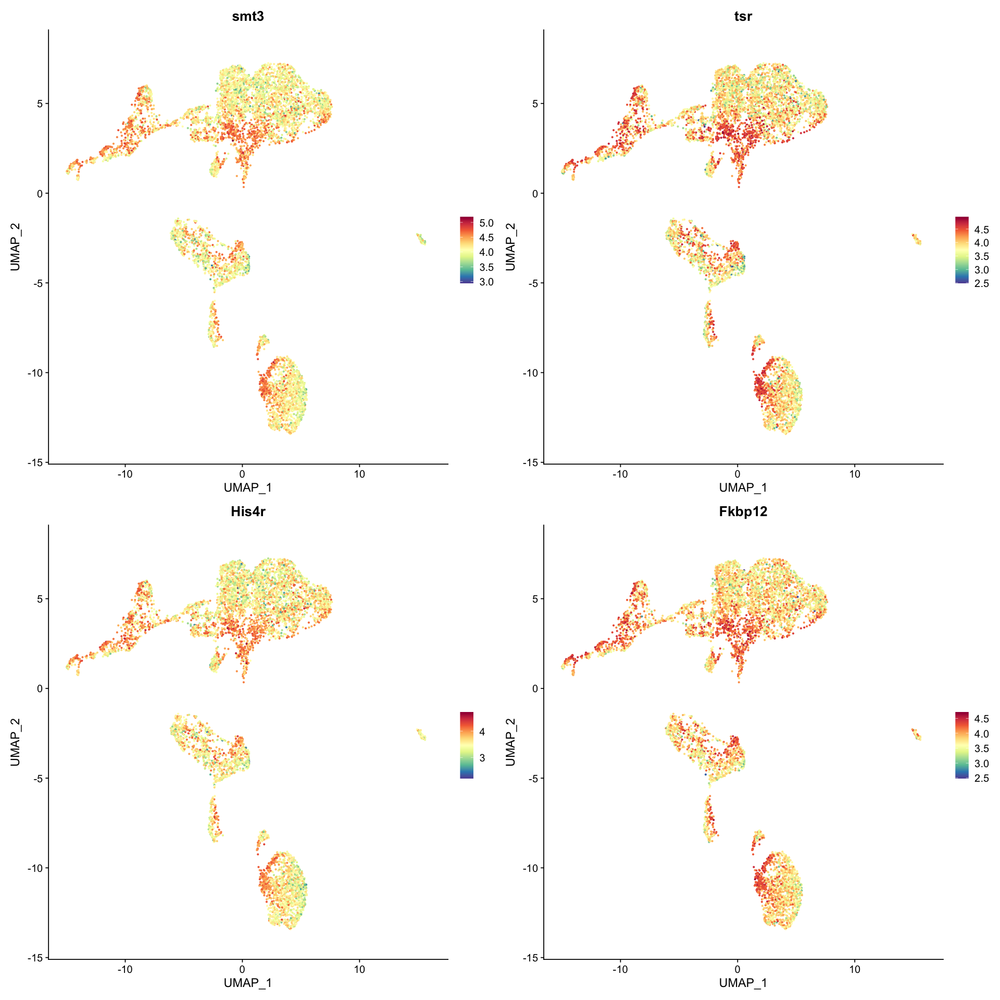

In [52]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("smt3", "tsr", "His4r", "Fkbp12"), pt.size = 0.5,  ncol = 2) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

cluster14はsimが高いのでmidline  と思われるが、E(spl) complex genesがマーカーとして抽出されていない。

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



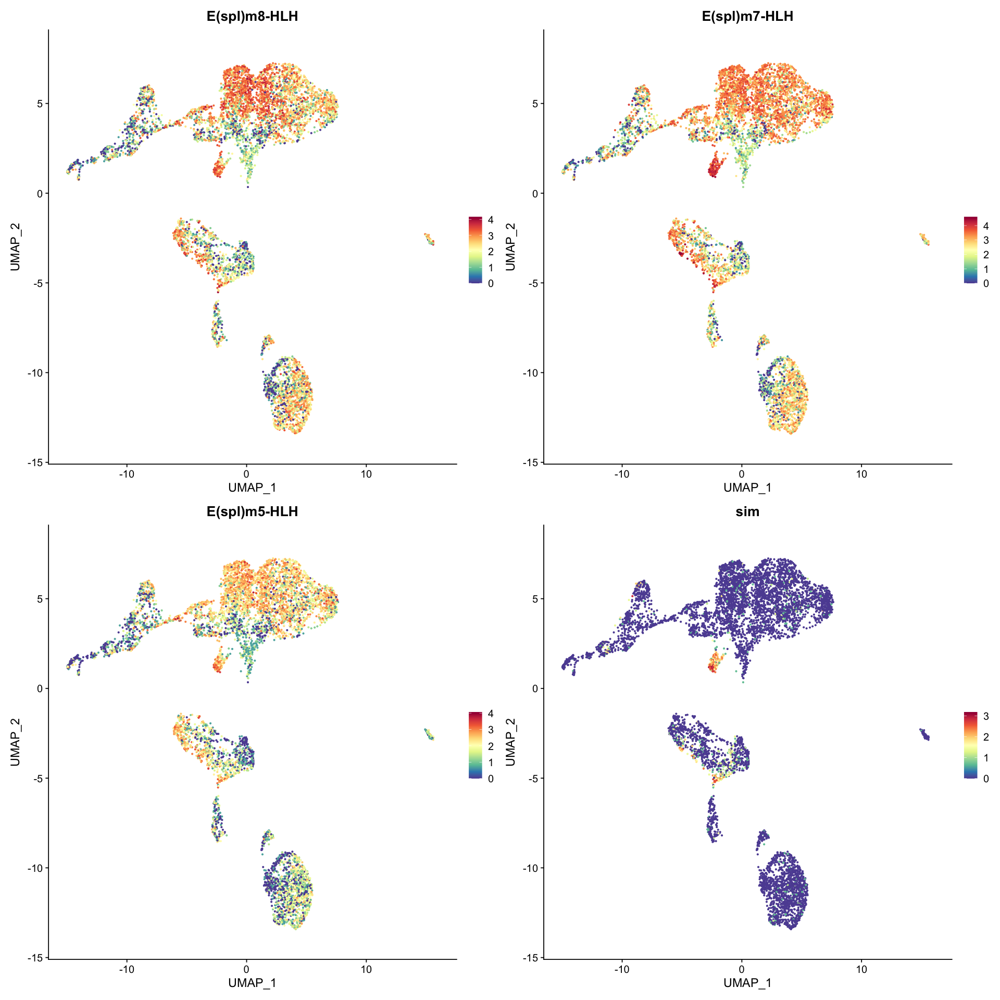

In [53]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m8-HLH", "E(spl)m7-HLH", "E(spl)m5-HLH", "sim"), pt.size = 0.5,  ncol = 2) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

E(spl) complex geneの発現が、midline以外にも見られる。simはmidlineに限局

In [54]:
seurat_clusters <- seu_HQC$seurat_clusters
seurat_clusters <- as.data.frame(seurat_clusters)
head(seurat_clusters)

,seurat_clusters
,<fct>
AAACCCAAGTGACCTT,14
AAACCCACAAGTGATA,7
AAACCCACACTTGGCG,5
AAACCCATCCGTGTCT,0
AAACGAAAGAATCGTA,4
AAACGAAAGACTTCCA,4


In [55]:
seurat_clusters$seurat_clusters <- gsub("10", "kkk", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("11", "lll", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("12", "mmm", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("13", "nnn", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("14", "ooo", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("15", "ppp", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("16", "qqq", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("17", "rrr", seurat_clusters$seurat_clusters)
seurat_clusters$seurat_clusters <- gsub("18", "sss", seurat_clusters$seurat_clusters)

seurat_clusters$seurat_clusters <- gsub("0", "aaa", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("1", "bbb", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("2", "ccc", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("3", "ddd", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("4", "eee", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("5", "fff", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("6", "ggg", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("7", "hhh", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("8", "iii", seurat_clusters$seurat_clusters) 
seurat_clusters$seurat_clusters <- gsub("9", "jjj", seurat_clusters$seurat_clusters) 

In [56]:
seurat_clusters$seurat_clusters <- gsub("kkk", "Mesoderm_tsr-high", seurat_clusters$seurat_clusters) #cluster10
seurat_clusters$seurat_clusters <- gsub("lll", "Ectoderm_PS14", seurat_clusters$seurat_clusters) #cluster11
seurat_clusters$seurat_clusters <- gsub("mmm", "Ectoderm_kn", seurat_clusters$seurat_clusters) #cluster12
seurat_clusters$seurat_clusters <- gsub("nnn", "Posterior_mesoderm", seurat_clusters$seurat_clusters) #cluster13
seurat_clusters$seurat_clusters <- gsub("ooo", "Anterior_midgut", seurat_clusters$seurat_clusters) #cluster14
seurat_clusters$seurat_clusters <- gsub("ppp", "Midline_cells", seurat_clusters$seurat_clusters) #cluster15
seurat_clusters$seurat_clusters <- gsub("qqq", "Anterior_mesoderm", seurat_clusters$seurat_clusters) #cluster16
seurat_clusters$seurat_clusters <- gsub("rrr", "Mesoderm_PS13", seurat_clusters$seurat_clusters) #cluster17
seurat_clusters$seurat_clusters <- gsub("sss", "Pole_cells", seurat_clusters$seurat_clusters) #cluster18

seurat_clusters$seurat_clusters <- gsub("aaa", "Neuroectoderm", seurat_clusters$seurat_clusters) #cluster0
seurat_clusters$seurat_clusters <- gsub("bbb", "Trunk_mesoderm", seurat_clusters$seurat_clusters)  #cluster1
seurat_clusters$seurat_clusters <- gsub("ccc", "Dorsal_ectoderm", seurat_clusters$seurat_clusters)  #cluster2
seurat_clusters$seurat_clusters <- gsub("ddd", "Dorsal_ectoderm", seurat_clusters$seurat_clusters)   #cluster3
seurat_clusters$seurat_clusters <- gsub("eee", "Amnioserosa", seurat_clusters$seurat_clusters)   #cluster4
seurat_clusters$seurat_clusters <- gsub("fff", "Hindgut", seurat_clusters$seurat_clusters)   #cluster5
seurat_clusters$seurat_clusters <- gsub("ggg", "Ectoderm_tsr-high", seurat_clusters$seurat_clusters)   #cluster6
seurat_clusters$seurat_clusters <- gsub("hhh", "Head_ectoderm", seurat_clusters$seurat_clusters)   #cluster7
seurat_clusters$seurat_clusters <- gsub("iii", "Ectoderm_Dfd", seurat_clusters$seurat_clusters)   #cluster8
seurat_clusters$seurat_clusters <- gsub("jjj", "Posterior_midgut", seurat_clusters$seurat_clusters)  #cluster9

In [57]:
levels(as.factor(seurat_clusters$seurat_clusters))

[1] "Amnioserosa"        "Anterior_mesoderm"  "Anterior_midgut"   
 [4] "Dorsal_ectoderm"    "Ectoderm_Dfd"       "Ectoderm_kn"       
 [7] "Ectoderm_PS14"      "Ectoderm_tsr-high"  "Head_ectoderm"     
[10] "Hindgut"            "Mesoderm_PS13"      "Mesoderm_tsr-high" 
[13] "Midline_cells"      "Neuroectoderm"      "Pole_cells"        
[16] "Posterior_mesoderm" "Posterior_midgut"   "Trunk_mesoderm"

In [58]:
colnames(seurat_clusters) <- c("Manual_ID")
head(seurat_clusters)
dim(seurat_clusters)

,Manual_ID
,<chr>
AAACCCAAGTGACCTT,Anterior_midgut
AAACCCACAAGTGATA,Head_ectoderm
AAACCCACACTTGGCG,Hindgut
AAACCCATCCGTGTCT,Neuroectoderm
AAACGAAAGAATCGTA,Amnioserosa
AAACGAAAGACTTCCA,Amnioserosa


[1] 7314    1

In [59]:
seu_HQC$manual_ID <- seurat_clusters

In [60]:
write.table(seurat_clusters, 
            file="./seurat_clusters_221228.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [61]:
Idents(seu_HQC) <- "manual_ID"

In [62]:
# write.table(levels(seu_HQC) , 
#             file="./210421_seurat_objects/manual_ID_list_210421.txt",sep="\t",col.names=T,row.names=T,quote=F)
#エクセルで修正 してカラーコードを追加、manual_ID_levels_color_210421.txtとして保存

In [63]:
saveRDS(seu_HQC, file = "../../data/seurat_object/Set2/seu_HQC_Set2.obj")

In [64]:
write.table(all.markers, file="./all.markers_221228.txt",sep="\t",col.names=T,row.names=T,quote=F)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



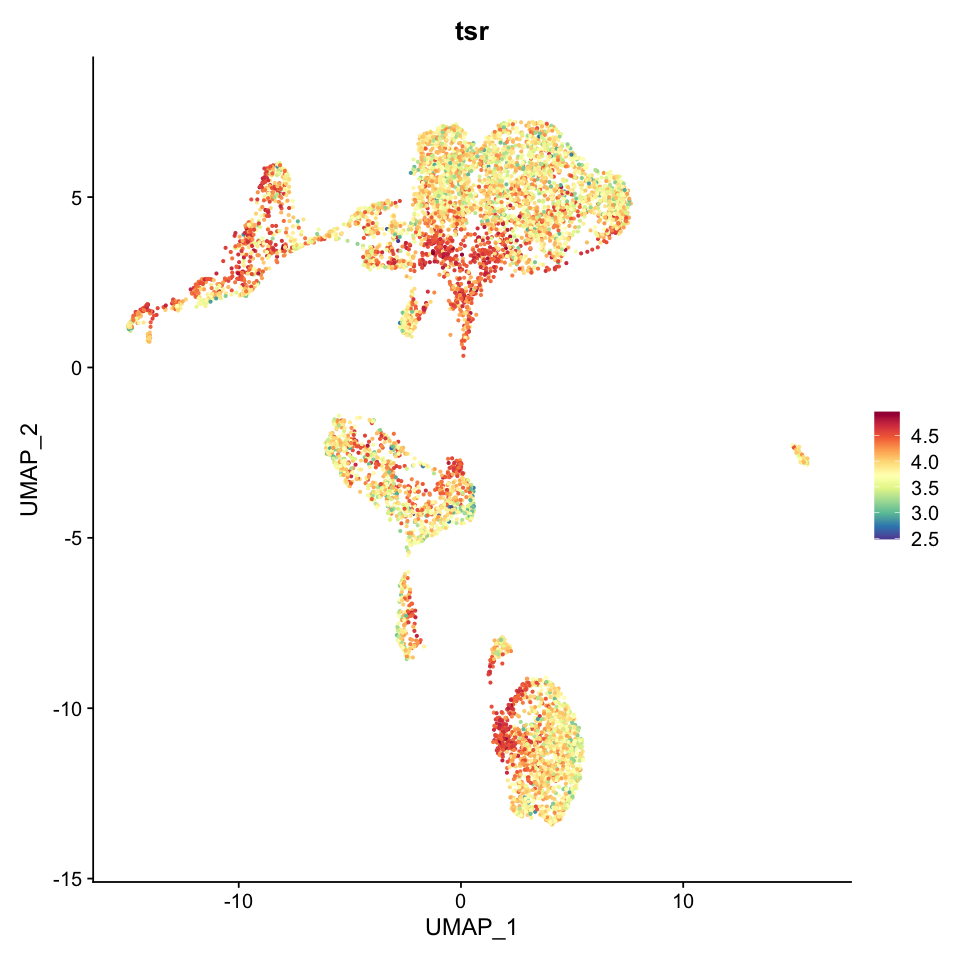

In [65]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("tsr"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_tsr_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



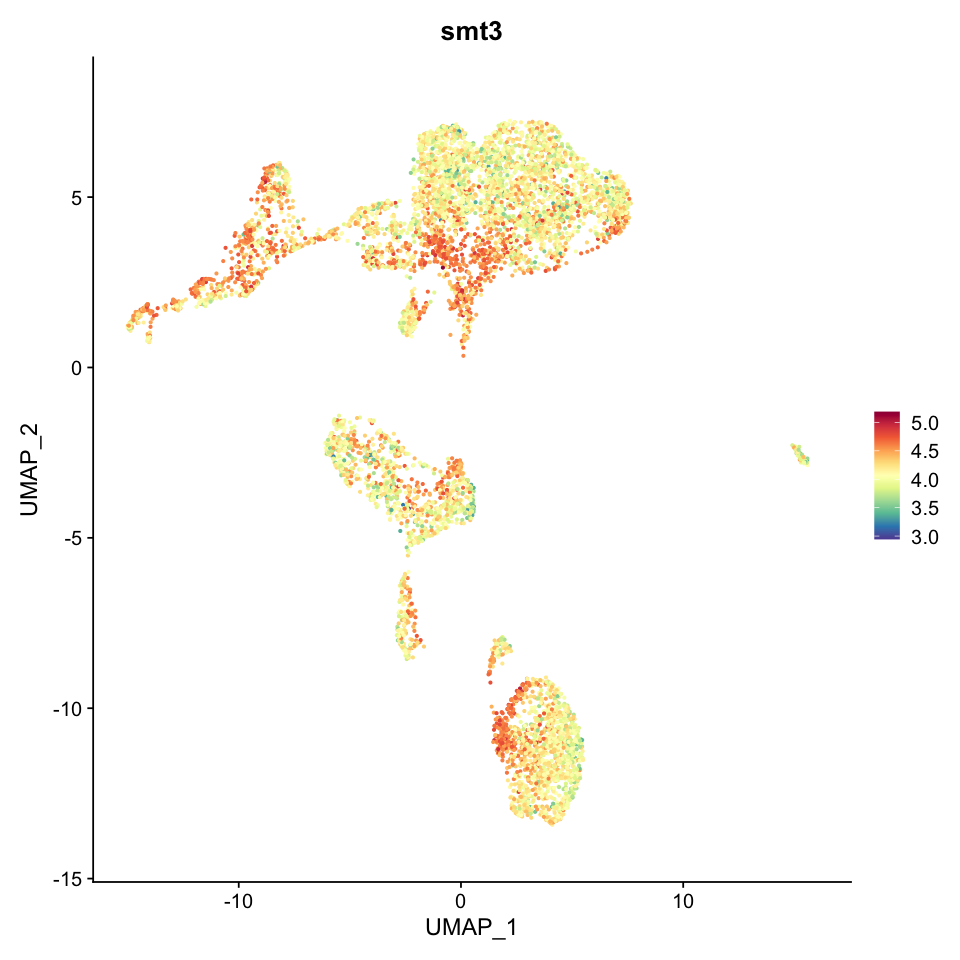

In [66]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("smt3"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_smt3_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



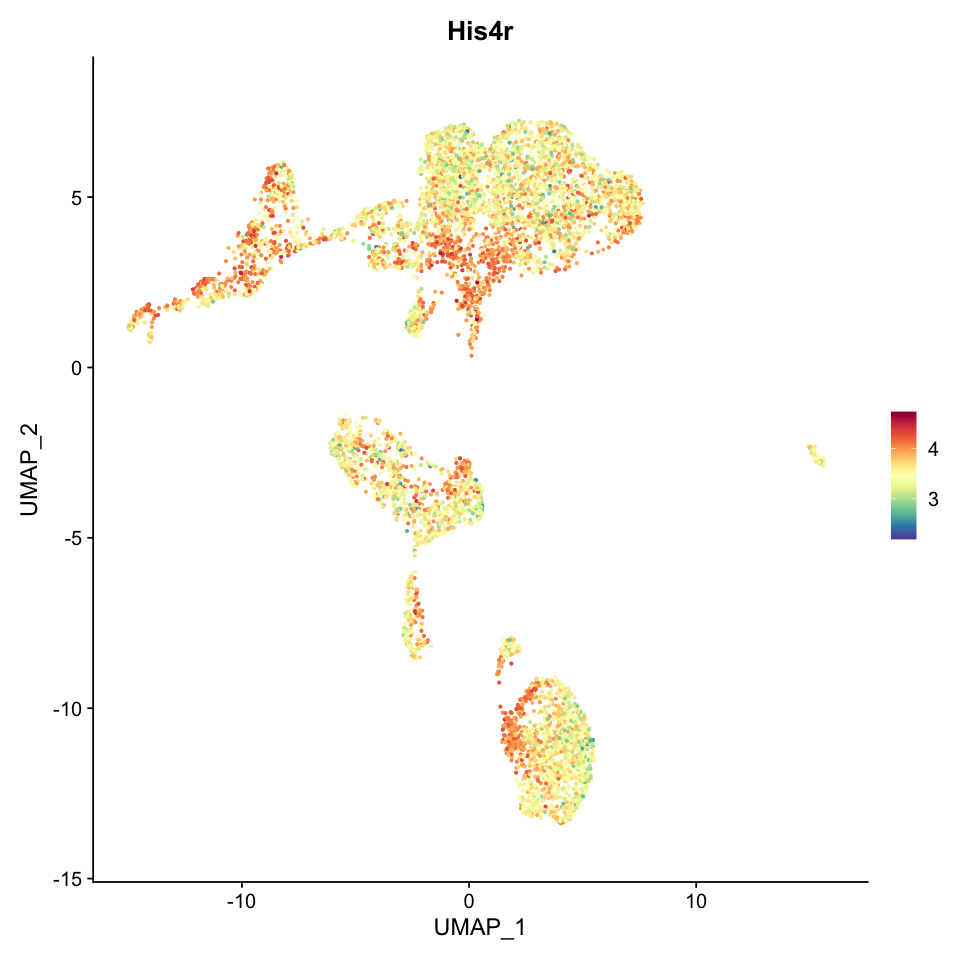

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("His4r"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_His4r_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



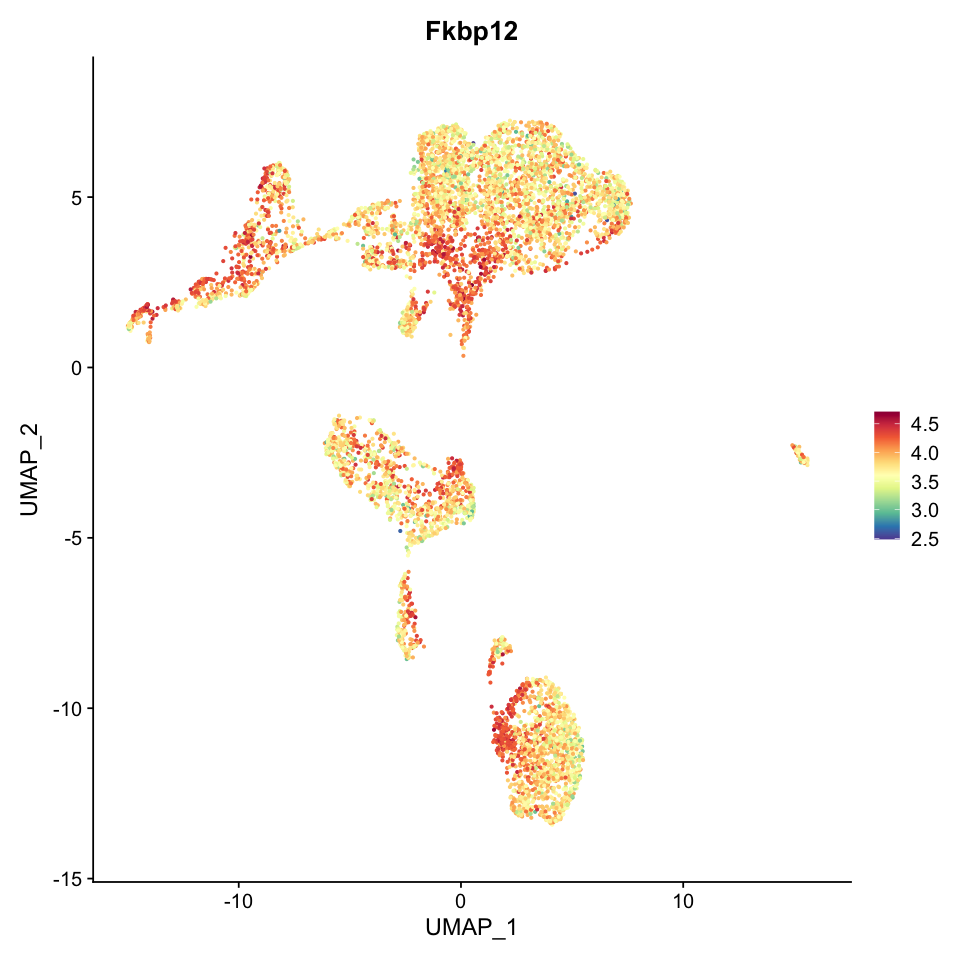

In [68]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("Fkbp12"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_Fkbp12_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



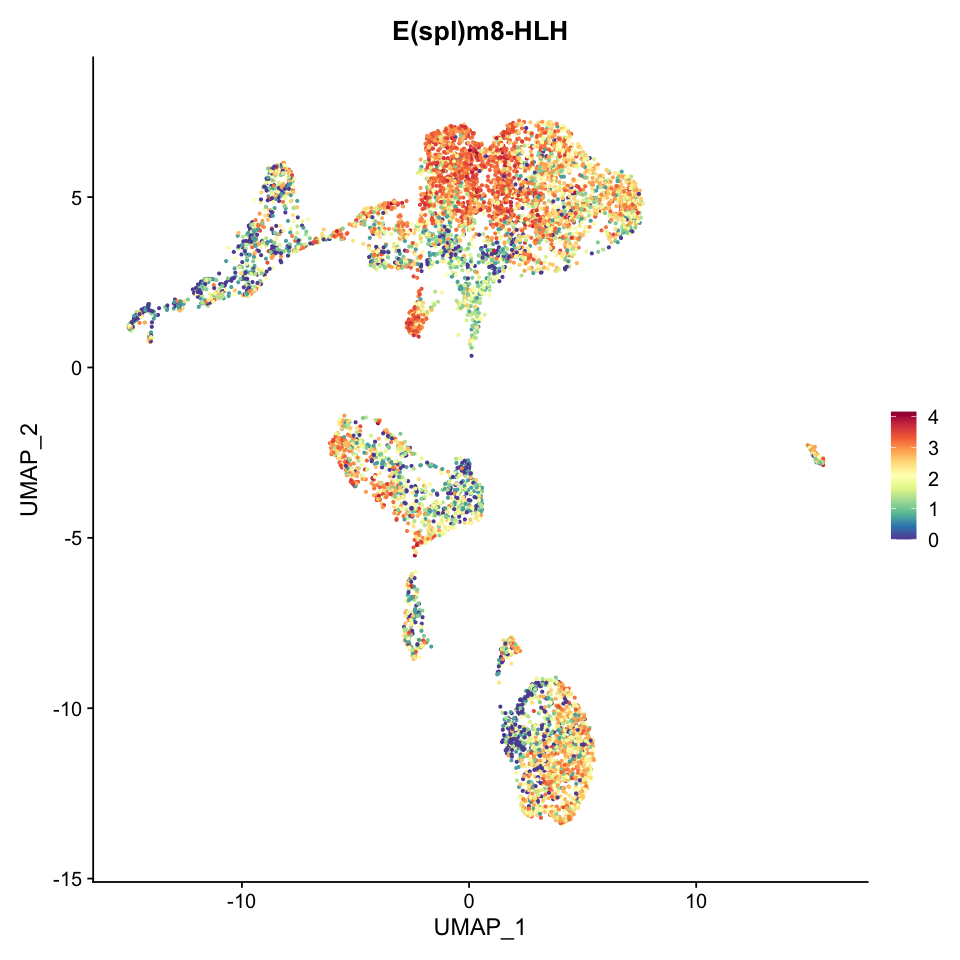

In [69]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m8-HLH"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_E(spl)m8-HLH_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



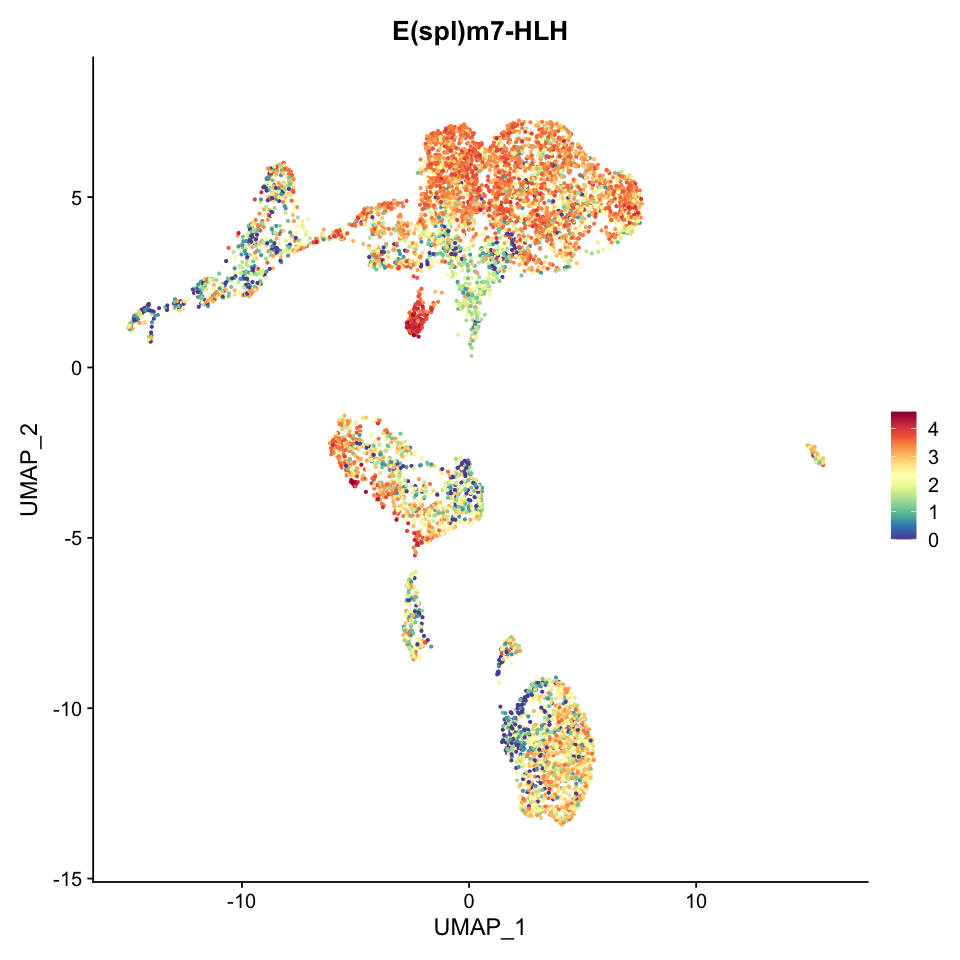

In [70]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m7-HLH"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_E(spl)m7-HLH_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



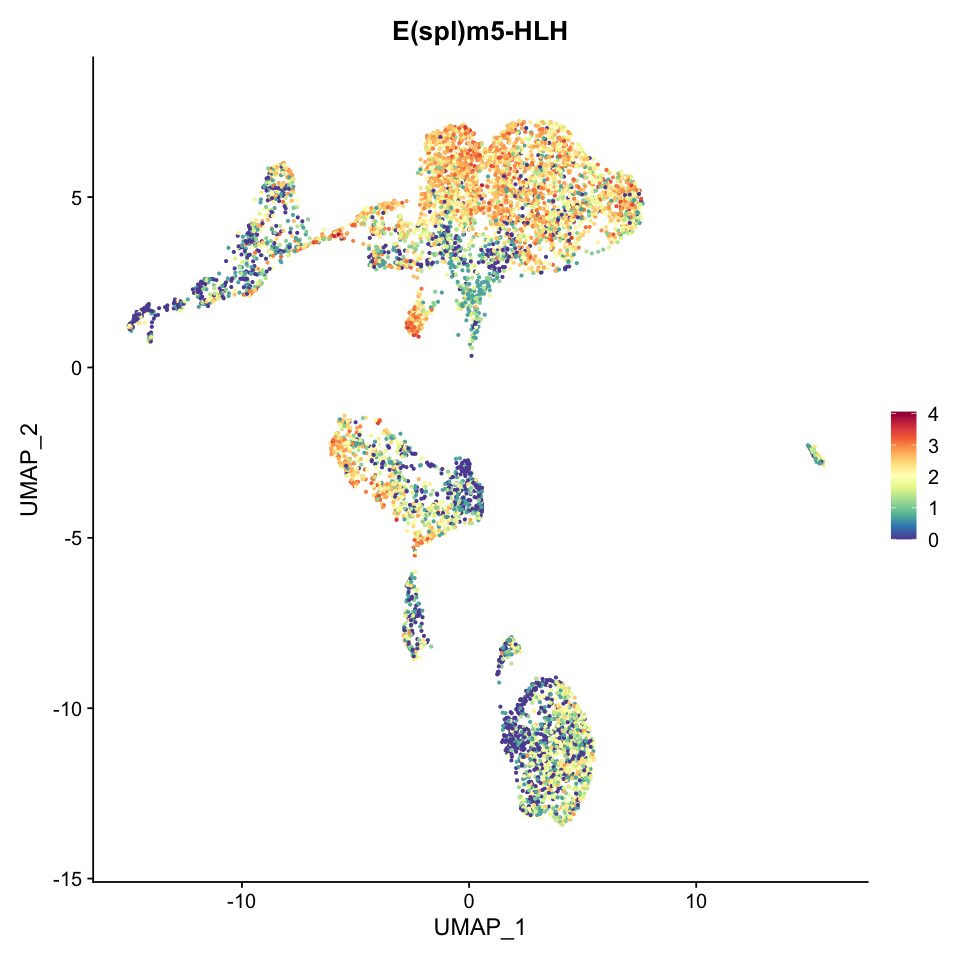

In [71]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("E(spl)m5-HLH"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_E(spl)m5-HLH_umap.pdf", width = 10.24, height = 10.24, plot=p)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



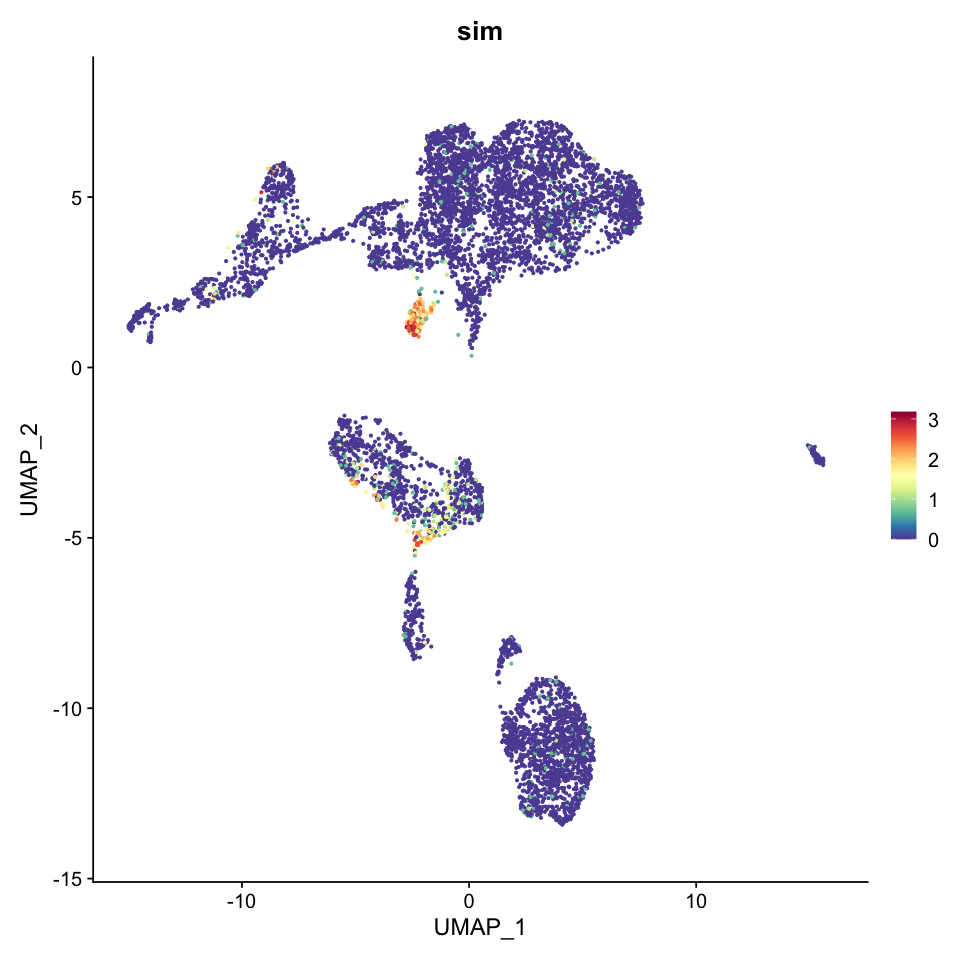

In [72]:
options(repr.plot.width=8, repr.plot.height=8)
p <- FeaturePlot(seu_HQC, reduction = "umap", features = c("sim"), pt.size = 0.5,  ncol = 1) & 
  scale_colour_gradientn(colours = rev(brewer.pal(n = 11, name = "Spectral")))

print(p)

# ggsave(file = "./210421_seurat_plot/10x_trypsin_sim_umap.pdf", width = 10.24, height = 10.24, plot=p)

In [73]:
Markers_1_VS_10 <- FindMarkers(seu_HQC, ident.1 = "Trunk_mesoderm", ident.2 = "Mesoderm_tsr-high", test.use = "MAST")
dim(Markers_1_VS_10)


 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>---------------------


 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [===========================


 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [===========================

[1] 882   5

In [74]:
write.table(Markers_1_VS_10, file="./Markers_1_VS_10_221228.txt",sep="\t",col.names=T,row.names=T,quote=F)

In [75]:
head(Markers_1_VS_10)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1.000,1.000,1.560757e-85
tsr,7.205497e-86,-0.5042628,1.000,1.000,8.160946e-82
His4r,1.127313e-83,-0.4242723,1.000,1.000,1.276795e-79
kis,7.644049e-82,0.6738195,0.999,0.988,8.657650e-78
Fkbp12,7.391129e-80,-0.3946673,1.000,1.000,8.371193e-76
roh,4.088191e-78,-0.5237355,1.000,1.000,4.630285e-74


In [76]:
cluster10_high <- filter(Markers_1_VS_10, avg_logFC < 0)

In [77]:
head(cluster10_high)

,p_val,avg_logFC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
smt3,1.378030e-89,-0.3775256,1,1,1.560757e-85
tsr,7.205497e-86,-0.5042628,1,1,8.160946e-82
His4r,1.127313e-83,-0.4242723,1,1,1.276795e-79
Fkbp12,7.391129e-80,-0.3946673,1,1,8.371193e-76
roh,4.088191e-78,-0.5237355,1,1,4.630285e-74
RpL41,8.279232e-77,-0.2805060,1,1,9.377058e-73


In [78]:
gtf_fbID_list <- read.table(file = "../../GLAD/GLAD_BDGPgtf_conversion_hyphen_210311.txt", header = T)
head(gtf_fbID_list)
tail(gtf_fbID_list)
dim(gtf_fbID_list)

,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf
,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>
1,FBgn0085206,CG34177,Edited00000,CG34178-CG34177,TRUE,in_GRAD_db,in_BDGP_gtf
2,FBgn0085207,CG34178,Edited00000,CG34178-CG34177,FALSE,in_GRAD_db,in_BDGP_gtf
3,FBgn0260470,SP555,Edited00001,SP555-CG14042,TRUE,in_GRAD_db,in_BDGP_gtf
4,FBgn0260451,CG14042,Edited00001,SP555-CG14042,FALSE,in_GRAD_db,in_BDGP_gtf
5,FBgn0053995,CG33995,Edited00002,Edited00002,TRUE,in_GRAD_db,in_BDGP_gtf
6,FBgn0264742,CG44000,Edited00002,Edited00002,FALSE,in_GRAD_db,in_BDGP_gtf


,id_in_Flybase,symbol_in_Flybase,BDGP_ref_id,BDGP_ref_symbol,GO_term_analysis,in_GRAD_db,in_BDGP_gtf
,<chr>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>
17725,FBgn0283501,lncRNA:CR46115,FBgn0283501,lncRNA:CR46115,TRUE,in_GRAD_db,in_BDGP_gtf
17726,FBgn0267796,Tmc,FBgn0267796,Tmc,TRUE,in_GRAD_db,in_BDGP_gtf
17727,FBgn0286809,xmas,FBgn0286809,xmas,TRUE,in_GRAD_db,in_BDGP_gtf
17728,FBgn0267828,Fatp1,FBgn0267828,Fatp,TRUE,in_GRAD_db,in_BDGP_gtf
17729,NA,NA,FBgnGAL4,GAL4,FALSE,NA,in_BDGP_gtf
17730,NA,NA,FBgnCD8mCherry,CD8mCherry,FALSE,NA,in_BDGP_gtf


[1] 17730     7

In [79]:
cluster10_high_list <- filter(gtf_fbID_list, BDGP_ref_symbol %in% rownames(cluster10_high))
dim(cluster10_high_list)
dim(cluster10_high)
#combineした遺伝子の分だけ、list の方で遺伝子数が多く見えている

[1] 334   7

[1] 328   5

In [80]:
setdiff(rownames(cluster10_high), cluster10_high_list$BDGP_ref_symbol)

character(0)

In [81]:
setdiff(cluster10_high_list$BDGP_ref_symbol, rownames(cluster10_high))

character(0)

In [82]:
write.table(cluster10_high_list, file="./cluster10_high_list_221228.txt",sep="\t",col.names=T,row.names=T,quote=F)
#このリストのid_in_Flybase をqueryにしてGO解析


In [83]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] RColorBrewer_1.1-2          MAST_1.16.0                
 [3] dplyr_1.0.3                 Matrix_1.3-2               
 [5] DropletUtils_1.10.2         SingleCellExperiment_1.12.0
 [7] SummarizedExperiment_1.20.0 Biobase_2.50.0             
 [9] GenomicRanges_1.42.0        GenomeInfoDb_1.26.2        
[11] IRanges_2.24.1              S4Vectors_0.28.1           
[13] BiocGenerics_0.36.0         MatrixGenerics_1.2.0       
[15] matrixStats_0.57.0          Seurat_3.2.3  

In [84]:
doublet_list <- rownames(doublet)

ERROR: Error in h(simpleError(msg, call)):  引数 'x' の評価中にエラーが起きました (関数 'rownames' に対するメソッドの選択時):  オブジェクト 'doublet' がありません  
